In [1]:
import matplotlib.pyplot as plt
import pygame
import numpy as np
import math
import random
import copy
import pickle

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
#### C'est le premier algo. Mutation uniquement. Pas de selection des meilleurs. 
### Tres limité

In [3]:
##### CONSTANTES

f = 0.3
rb = 5
rt = 20
dt = 0.0
m = 1
g = 9.81
k = 2
num_elites = 5
nbre_mouvements = 50
nb_gen = 100
nb_pop = 100
mutation_rate = 5/(nbre_mouvements*2)
v_max = 5

In [4]:
###### FONCTIONS UTILES

def produitvectoriel(vect1,vect2):
    return (vect1[0]*vect2[1] - vect1[1]*vect2[0])

def produitscalaire(vect1,vect2):
    return(vect1[0]*vect2[0] + vect1[1]*vect2[1])


In [5]:
##### CLASSE JOUEUR


class Joueur:
    
    
    
    def __init__(self, array_trou,array_balle,obstacles, nbre_mouvements):
        self.is_best = False
        self.fitness = 0
        self.partie = Partie(array_balle,array_trou,obstacles)
        self.liste_mouvements = []
        self.liste_emplacements = [array_balle]
        for i in range(nbre_mouvements):
            v = random.random()*v_max
            t = random.random()*2*np.pi
            self.liste_mouvements.append([v,t])
            
    def evaluate_fitness(self):
        
        distance = np.sqrt((self.partie.trou.position[0] - self.partie.balle.position[0])**2 + (self.partie.trou.position[1] - self.partie.balle.position[1])**2 )
        
        if self.partie.reached_goal:
            self.fitness = 3 + 10/(self.partie.nb_coups**2)
        
        else: 
            self.fitness = self.partie.nb_coups/distance**2 
            
        
    def faire_moves(self):
        for i in self.liste_mouvements:
            self.liste_emplacements.append(self.partie.deplacement(i))
    
    def mutate(self):
        for i in self.liste_mouvements:
            if random.random() < mutation_rate:
                i[0] = random.random()*v_max
            if random.random() < mutation_rate:
                i[1] = random.random()*2*np.pi
    
                

In [6]:
###### CLASSE POPULATION

class Population:
    def __init__(self, size, arraytrou, arrayballe, obstacles, nbre_mouvements):
        self.liste_joueur = []
        for i in range(size):
            self.liste_joueur.append(Joueur(arraytrou, arrayballe, obstacles, nbre_mouvements))

    def mutate_all(self,arraytrou, arrayballe, obstacles, nbre_mouvements):
        for i in range(len(self.liste_joueur)):
            self.liste_joueur[i].partie = Partie(arrayballe,arraytrou,obstacles)
            nouveauJoueur = Joueur(arraytrou, arrayballe, obstacles, nbre_mouvements)
            for j in range(nbre_mouvements):
                nouveauJoueur.liste_mouvements.append(self.liste_joueur[i].liste_mouvements[j].copy())
            nouveauJoueur.mutate()
            self.liste_joueur[i].faire_moves()
            self.liste_joueur[i].evaluate_fitness()
            nouveauJoueur.faire_moves()
            nouveauJoueur.evaluate_fitness()
            #print("nb_coups du vieux : "+ str(self.liste_joueur[i].partie.nb_coups))
            #print("nb_coups du jeune : "+ str(nouveauJoueur.partie.nb_coups))
            if nouveauJoueur.fitness > self.liste_joueur[i].fitness :
                self.liste_joueur[i] = nouveauJoueur
    
    
    def step_ga(self,size, arraytrou,arrayballe,obstacles,nbre_mouvements):
        liste = []
        
        for j in self.liste_joueur: 
            j.faire_moves()
            j.evaluate_fitness()
            
        fits = [self.liste_joueur[i].fitness for i in range(nb_pop)]
        
        for i in range(num_elites):
            liste.append(self.liste_joueur[i])
            
            
            
            
        for i in range(num_elites,nb_pop):
            parent = self.tournament_selection(k)
            partie = Partie(arrayballe,arraytrou,obstacles)
            child = Joueur(arraytrou, arrayballe, obstacles, nbre_mouvements)
            child.partie = partie
            for j in range(nbre_mouvements):
                child.liste_mouvements[j] = parent.liste_mouvements[j].copy()
            child.mutate()
            child.faire_moves()
            child.evaluate_fitness()
            liste.append(child)
            
        self.liste_joueur = liste
        
        
    def tournament_selection(self, k):
        select = []
        for i in range(k):
            select.append(random.randint(0,nb_pop-1))
        best = select[0]
        for j in select:
            if self.liste_joueur[j].fitness > self.liste_joueur[best].fitness:
                best = j
        return self.liste_joueur[best]   
        
                
    def print_partie(self,arraytrou, arrayballe, obstacles, nbre_mouvements):
        pygame.init()
        win = pygame.display.set_mode((700,700))
        pygame.display.set_caption("Le mini-golf de l'enfer")
        x_trou = int(arraytrou[0])
        y_trou = int(arraytrou[1])
        win.fill((0,128,0))
        for i in obstacles:
            pygame.draw.line(win, (0,0,0), i.depart, i.arrivee,10)

        run = True
        couleur = self.generer_couleur()
        while run :

            for i in range(nbre_mouvements): 
                print(i)
                pygame.time.delay(1)
                for event in pygame.event.get():
                    if event.type == pygame.QUIT:
                        run = False
                pygame.draw.circle(win, (0,0,0), (x_trou,y_trou), rt)
                for obs in obstacles:
                    pygame.draw.line(win, (0,0,0), obs.depart, obs.arrivee,10)
                ind_coul = 0
                for j in self.liste_joueur:
                    print(j.liste_emplacements)
                    pygame.draw.circle(win, couleur[ind_coul], (int(j.liste_emplacements[i][0]),int(j.liste_emplacements[i][1])), rb)
                    pygame.display.update()
                    ind_coul += 1
                win.fill((0,128,0))
        print("fin")
        pygame.display.flip()
        pygame.quit()

    def generer_couleur(self):
        couleur = []
        for i in range(nb_pop):
            couleur.append((random.randint(0,250),random.randint(0,250),random.randint(0,250)))
        print(couleur)
        return couleur

In [7]:
#### CLASSE SEGMENT

class Segment:
    def __init__(self,array1,array2):
        self.depart = array1
        self.arrivee = array2
        
    def cross(self , segment):
        ab = [self.arrivee[0] - self.depart[0] , self.arrivee[1] - self.depart[1]]
        apbp = [segment.arrivee[0] - segment.depart[0] , segment.arrivee[1] - segment.depart[1]]
        abp = [segment.arrivee[0] - self.depart[0], segment.arrivee[1] - self.depart[1]]
        aap = [segment.depart[0] - self.depart[0], segment.depart[1] - self.depart[1] ]
        apb = [self.arrivee[0] - segment.depart[0] , self.arrivee[1] - segment.depart[1]]
        apa = [self.depart[0] - segment.depart[0] , self.depart[1] - segment.depart[1]]
        
        c1 = produitvectoriel(ab,apbp) != 0
        c2 = (produitvectoriel(ab,abp) * produitvectoriel(ab,aap))<=0
        c3 = (produitvectoriel(apbp,apb) * produitvectoriel(apbp,apa))<=0
        return(c1 and c2 and c3)

In [8]:

##### CLASSE TROU

class Trou:
    def __init__(self, array):
        self.position = array.copy()
 


In [9]:
##### CLASSE BALLE

class Balle:
    def __init__(self, array):
        self.position = array.copy()


In [10]:
##### CLASSE PARTIE

class Partie:
    def __init__(self, arrayballe,arraytrou, obstacles):
        self.balle = Balle(arrayballe)
        self.trou = Trou(arraytrou)
        self.obstacles = obstacles
        self.is_dead = False
        self.nb_coups = 1
        self.reached_goal = False 
        
    def is_won(self):
        distance = np.sqrt((self.trou.position[0] - self.balle.position[0])**2 + (self.trou.position[1] - self.balle.position[1])**2 )
       # print(distance)
        if distance < rt :
            self.reached_goal = True
    
    def is_possible_move(self,segment_dep):
        liste_obstacles_cross = []
        for i in self.obstacles: # Pour tous les obstacles
            if i.cross(segment_dep): # Si un segment_dep et i se croisent alors le move n'est pas possible
                    liste_obstacles_cross.append(i)
        if len(liste_obstacles_cross) > 0 :
            liste_distances = []
            liste_inter = []
            for i in liste_obstacles_cross:
                if (segment_dep.depart[0] - segment_dep.arrivee[0] == 0):
                    a_i = (i.depart[1] - i.arrivee[1]) / (i.depart[0] - i.arrivee[0])
                    b_i = i.depart[1] - a_i *i.depart[0]
                    x_inter = segment_dep.depart[0]
                    y_inter = a_i * x_inter + b_i
                    liste_inter.append([x_inter , y_inter])
                    
                    
                elif (i.depart[0] - i.arrivee[0] == 0):
                    a_segment_dep = (segment_dep.depart[1] - segment_dep.arrivee[1]) / (segment_dep.depart[0] - segment_dep.arrivee[0])
                    b_segment_dep = segment_dep.depart[1] - a_segment_dep * segment_dep.depart[0]
                    x_inter = i.depart[0]
                    y_inter = a_segment_dep * x_inter + b_segment_dep
                    liste_inter.append([x_inter , y_inter])
                
                else :
                    a_segment_dep = (segment_dep.depart[1] - segment_dep.arrivee[1]) / (segment_dep.depart[0] - segment_dep.arrivee[0])
                    b_segment_dep = segment_dep.depart[1] - a_segment_dep * segment_dep.depart[0]
                    a_i = (i.depart[1] - i.arrivee[1]) / (i.depart[0] - i.arrivee[0])
                    b_i = i.depart[1] - a_i *i.depart[0]
                    x_inter = (b_i - b_segment_dep) / (a_segment_dep - a_i)
                    y_inter = a_i * x_inter + b_i
                    liste_inter.append([x_inter , y_inter])
                
                liste_distances.append(np.sqrt( (x_inter - self.balle.position[0])**2 + (y_inter - self.balle.position[1])**2))
            self.balle.position[0] = liste_inter[liste_distances.index(min(liste_distances))][0]
            self.balle.position[1] = liste_inter[liste_distances.index(min(liste_distances))][1]
                
            return False
        return True
    
    
    def deplacement(self,vitesse_initiale): # La vitesse sera de la forme [ ||v|| , theta)]
        distance =0.5*m/f*vitesse_initiale[0]**2
       # print(vitesse_initiale[0])
        segment_dep = Segment([self.balle.position[0],self.balle.position[1]],[self.balle.position[0] + np.cos(vitesse_initiale[1]) * distance,self.balle.position[1] + np.sin(vitesse_initiale[1]) * distance] )
        self.is_won()
        
        if self.reached_goal:
            return (self.balle.position[0],self.balle.position[1])
        if self.is_possible_move(segment_dep):
            self.nb_coups +=1
            self.balle.position[0] += np.cos(vitesse_initiale[1]) * distance
            self.balle.position[1] += np.sin(vitesse_initiale[1]) * distance  
        else :
            self.is_dead = True
            #print("La balle est sur le mur")
        return (self.balle.position[0],self.balle.position[1])
    
    def plot_fitness(self):
        mat = np.zeros((700,700))
        for i in range(700):
            for j in range(700):
                mat[i,j] = np.sqrt((self.trou.position[0] - i)**2 + (self.trou.position[1] - j)**2 )
        return mat





In [ ]:
#DEFINITION DE LA PARTIE
obstacles = []
# On ajoute les murs
obstacles.append(Segment([0,0],[0,700]))
obstacles.append(Segment([0,0],[700,0]))
obstacles.append(Segment([700,0],[700,700]))
obstacles.append(Segment([0,700],[700,700]))
# On ajoute les obstacles
obstacles.append(Segment([300,300],[900,300]))
obstacles.append(Segment([0,500],[400,500]))

#obstacles.append(Segment([0,400],[400,400]))


array_balle = [100,600]
array_trou = [100,100]
population = pickle.load( open( "./data/gen_mut90.pkl", "rb" ) )
population.print_partie(array_trou, array_balle, obstacles, nbre_mouvements)
#population.total_transform(array_trou, obstacles, array_balle)

[(93, 191, 246), (22, 67, 204), (229, 46, 165), (55, 33, 10), (79, 38, 168), (8, 39, 118), (217, 86, 191), (73, 34, 38), (30, 20, 92), (2, 114, 197), (236, 177, 98), (216, 68, 183), (206, 77, 168), (42, 93, 134), (176, 173, 151), (130, 229, 233), (107, 41, 0), (94, 70, 210), (198, 16, 207), (138, 135, 149), (16, 77, 128), (157, 154, 227), (88, 166, 2), (248, 149, 227), (169, 132, 154), (85, 88, 61), (113, 159, 146), (68, 235, 216), (191, 48, 165), (55, 185, 58), (5, 126, 17), (120, 198, 167), (22, 73, 107), (72, 152, 152), (14, 161, 226), (153, 248, 0), (132, 218, 85), (220, 211, 224), (19, 12, 112), (231, 81, 172), (51, 157, 215), (8, 61, 178), (62, 220, 49), (91, 153, 198), (69, 244, 223), (180, 160, 213), (160, 160, 124), (96, 173, 68), (93, 55, 141), (147, 53, 141), (135, 146, 14), (81, 115, 71), (204, 214, 109), (133, 202, 136), (70, 153, 213), (13, 162, 139), (35, 218, 217), (213, 23, 83), (191, 193, 48), (245, 1, 27), (78, 152, 233), (106, 244, 200), (25, 114, 226), (184, 240, 2

[[100, 600], (114.74594796078306, 607.6524433788801), (126.95232416608536, 619.4517671048033), (116.23487413649622, 592.0960483879593), (116.94090410411205, 590.1754056120353), (115.94777242632803, 590.6893988593212), (131.97636980930335, 593.9795055681901), (150.75626924290162, 565.1083508856043), (151.04694438844552, 565.0562151875243), (138.92736648710203, 551.2003883888726), (134.71338187088335, 539.3935216797623), (133.5838004840575, 543.3228264657148), (169.24188569445576, 522.2434902370665), (149.73436693586876, 501.3594453282168), (147.238296770804, 500.0), (147.238296770804, 500.0), (147.238296770804, 500.0), (147.238296770804, 500.0), (147.2382967708039, 500.0), (147.23829677080383, 500.0), (147.2382967708038, 500.0), (147.2382967708038, 500.0), (147.23829677080377, 500.0), (147.2382967708038, 500.0), (147.2382967708038, 500.0), (147.23829677080403, 500.0), (147.2382967708038, 500.0), (147.2382967708038, 500.0), (147.2382967708038, 500.0), (147.23829677080383, 500.0), (147.23

[[100, 600], (95.72645716775675, 610.6146704866844), (85.21729546557015, 630.1028956732463), (64.30253055464746, 604.8925801244618), (93.30196522597237, 589.4076483198073), (83.06265854481705, 592.0832350515734), (90.94274700481577, 594.0013181724081), (72.88411516194196, 594.7950971590126), (65.85917593836776, 598.7727594105125), (65.6696571474486, 599.4780028630059), (63.978066999367414, 622.5180944385819), (59.993398374319476, 621.6027769204874), (83.92012956383095, 607.458450083523), (72.57166865077878, 607.805226700333), (65.52731464575037, 610.6747627548917), (66.07062484157608, 611.1975797514316), (72.23562686654812, 610.5020590498685), (87.67054469540989, 615.7262849943742), (53.60837767531993, 595.8284242081621), (53.11212024250568, 594.9234266668979), (51.81121014929426, 606.2425590159968), (51.48593603267708, 606.5615975343445), (55.14601789564432, 628.9523323360968), (79.37969610160776, 601.7338823362184), (77.21838363147494, 600.8944955734041), (85.35420502403308, 569.2333

[[100, 600], (95.72645716775675, 610.6146704866844), (85.21729546557015, 630.1028956732463), (64.30253055464746, 604.8925801244618), (89.51346166504005, 579.8210329252288), (79.27415498388474, 582.4966196569949), (87.15424344388346, 584.4147027778296), (69.09561160100964, 585.208481764434), (66.05742874068893, 577.7291092647405), (65.86790994976978, 578.4343527172339), (58.00300426648463, 547.5002204402908), (61.02454894302069, 550.2544277632911), (84.95128013253216, 536.1101009263267), (73.60281921947998, 536.4568775431368), (66.55846521445157, 539.3264135976955), (74.80541528458659, 547.2622957133065), (77.34688116262146, 552.9219732840694), (88.39044685097002, 540.9399499995781), (54.328279830880064, 521.042089213366), (53.83202239806582, 520.1370916721017), (64.42902675459968, 515.9515662720306), (48.380499887144595, 534.053627579944), (52.04058175011183, 556.4443623816962), (70.4899392225791, 535.7226663343063), (69.10605157998918, 536.1360866675476), (89.68560814306952, 561.53496

[[100, 600], (99.30968729885176, 601.2994409897148), (88.80052559666515, 620.7876661762766), (67.88576068574247, 595.5773506274921), (68.01307278467554, 597.6196871857866), (43.680236095048244, 603.977990244803), (47.92700801680159, 597.0685933651583), (29.86837617392777, 597.8623723517628), (32.35486412261837, 605.5427984963811), (32.16534533169922, 606.2480419488745), (25.827799685997952, 581.3212998861014), (21.843131060950014, 580.4059823680069), (22.094423872095177, 580.2574302058053), (31.69191511144348, 574.1914611135933), (24.647561106415072, 577.060997168152), (32.89451117655008, 584.996879283763), (35.435977054584946, 590.6565568545259), (50.87089488344671, 595.8807827990315), (50.83799984184661, 595.8615667298387), (51.57145860548206, 595.1353916604759), (50.270548512270636, 606.4545240095748), (49.96829579044165, 606.7954523294275), (53.62837765340889, 629.1861871311797), (72.07773512587616, 608.4644910837898), (71.0364401758158, 610.5360959105167), (79.17226156837394, 578.

[[100, 600], (96.80586063924862, 607.933636828703), (99.92134682684483, 629.8545662437563), (132.33555669900036, 634.5775313836131), (145.35506915279709, 627.6254557737998), (141.69044907156885, 621.0494010315722), (134.673014439522, 625.1151664184072), (123.94949419156762, 625.5865257721675), (126.43598214025822, 633.2669519167858), (126.24646334933907, 633.9721953692792), (130.3818455559586, 627.5560360723155), (130.2478380756388, 627.5252532379484), (154.1745692651503, 613.380926400984), (142.82610835209812, 613.727703017794), (135.78175434706972, 616.5972390723527), (136.0409550601317, 619.4653307183277), (138.58242093816656, 625.1250082890906), (154.01733876702832, 630.3492342335962), (129.8560730937176, 616.2351145857574), (106.20352160103748, 593.0398425474746), (107.69213075849773, 581.7438624225202), (108.14594206659112, 581.7033146263143), (108.18468887915338, 581.9403502001011), (76.32241494288309, 596.7874870314781), (75.28111999282272, 598.859091858205), (81.49046800185607

[[100, 600], (100.6745521236463, 611.4227569926175), (90.16539042145969, 630.9109821791793), (84.09120711448332, 633.6639109460917), (85.59233153767791, 632.2732375646073), (78.30868218957231, 634.1764949004281), (86.18877064957103, 636.0945780212628), (75.46525040161664, 636.5659373750232), (77.95173835030724, 644.2463635196415), (77.76221955938809, 644.9516069721349), (75.88129767055234, 637.5535924434294), (71.89662904550441, 636.6382749253348), (95.82336023501588, 622.4939480883704), (84.4748993219637, 622.8407247051805), (77.4305453169353, 625.7102607597392), (85.67749538707031, 633.6461428753502), (88.21896126510518, 639.3058204461131), (103.65387909396695, 644.5300463906187), (69.59171207387699, 624.6321856044067), (69.09545464106274, 623.7271880631424), (70.58406379852299, 612.4312079381881), (70.28181107669401, 612.7721362580407), (70.32055788925628, 613.0091718318275), (88.76991536172355, 592.2874757844376), (87.72862041166319, 594.3590806111645), (95.86444180422133, 562.6979

[[100, 600], (101.62183740718078, 611.3271373834953), (91.11267570499417, 630.8153625700571), (87.36403652891114, 632.5143130467017), (123.03490525497047, 628.5107164362521), (115.75125590686487, 630.413973772073), (123.63134436686359, 632.3320568929076), (132.37370769436598, 626.1041238811769), (132.53349040739002, 626.5976711461914), (132.34397161647087, 627.3029145986848), (130.4630497276351, 619.9049000699792), (123.35983327100074, 618.2732214865447), (153.5792662910154, 600.4089535229288), (149.43580850603655, 610.9796477622461), (142.40707890837476, 613.8872448387898), (170.60275119947678, 641.0194003107729), (139.84629028210838, 664.3270601718843), (123.59399477933925, 663.147180519703), (89.5318277592493, 643.249319733491), (89.03557032643505, 642.3443221922267), (90.5241794838953, 631.0483420672724), (90.4893911011942, 631.0875818954298), (90.23267454952529, 632.3294402815361), (75.5503493241184, 608.7880553562035), (74.50905437405804, 610.8596601829304), (74.58840294797858, 6

[[100, 600], (96.44980361972947, 608.8180149863645), (96.45077654383743, 608.8179488773106), (97.25030130713051, 609.0471748302463), (98.08786753767475, 610.4714894351189), (118.12384158517054, 645.2586771805898), (116.05686834337767, 648.8559615604565), (133.72750037146912, 645.048989949869), (119.38172054754378, 609.7326722577864), (116.32815183923499, 618.1653874656366), (107.07373501847822, 581.7660502570969), (110.09527969501427, 584.5202575800972), (133.44276544434643, 569.4389659818705), (125.90846639028709, 577.932619900005), (118.00131497649313, 581.1536187388681), (108.23881661280207, 545.4035800269548), (90.93255057716647, 562.2806073806131), (100.6032994762737, 562.4111703863662), (100.56427572801427, 562.5025214994037), (100.55661998184169, 562.483503320102), (111.15362433837555, 558.2979779200309), (109.77773369911436, 559.1800906485834), (124.20548928993804, 548.5242141765843), (102.3149513166792, 565.5703816481486), (71.42212742102751, 547.9458845454858), (84.2802322891

[[100, 600], (104.1627934648794, 599.142457992968), (93.6536317626928, 618.6306831795299), (75.33770682631301, 626.9317887112081), (77.14278626660091, 625.9679239893044), (69.85913691849531, 627.8711813251252), (73.5293038631581, 620.6389816877991), (62.80578361520372, 621.1103410415594), (61.78176550748363, 629.1180220415107), (61.592246716564475, 629.8232654940041), (91.03817740914458, 625.2603197668653), (90.60778448468297, 629.3260487471277), (97.74417833747154, 625.1073576818228), (104.82141717595388, 636.4838208113458), (97.77706317092547, 639.3533568659045), (90.68088967277761, 630.3736724562854), (90.44835983765212, 636.5734247811762), (74.15610433205862, 636.8761385790439), (50.01157726535429, 622.7717970073859), (50.211338265312726, 621.7591828003883), (51.69994742277297, 610.463202675434), (51.39769470094399, 610.8041309952866), (51.205532249619225, 610.6600450104546), (78.66316899730066, 579.8205535151982), (77.6218740472403, 581.8921583419251), (110.17935092646468, 578.954

[[100, 600], (99.77365685645779, 623.0342361196605), (111.72637243968043, 625.881346044486), (119.31362467106905, 617.5591975155885), (124.52416547396416, 614.7769064153422), (125.21270632123806, 612.7035180760503), (124.824686290849, 620.8043993522975), (147.50119371469214, 601.477505396597), (148.03566347204418, 601.4823545976916), (148.2100422816377, 605.7031718445173), (139.9392929353965, 636.5312756847802), (142.96083761193256, 639.2854830077805), (118.25035752033006, 626.5598152167164), (120.73771531115577, 617.2461866685), (118.0864782030616, 633.3992303734109), (103.7492613977351, 646.5317304227423), (108.7822554834298, 642.9040631905427), (115.49958959388044, 635.6159050002904), (99.5269514965184, 626.2852793515345), (99.35986317581747, 625.9805695186747), (99.28766682300751, 626.1777156360716), (99.1204623907797, 626.3663151821945), (101.24227575929578, 639.3466151350324), (119.69163323176305, 618.6249190876424), (117.32580397059779, 587.0871821968278), (117.22571898061682, 5

[[100, 600], (98.2207743678695, 621.9984227911464), (98.57430994184227, 599.8600305007657), (131.30780884921998, 601.0869985643884), (139.13947757406925, 596.9050944171033), (135.733141403073, 588.846274880841), (129.2495159199251, 593.718383006705), (124.15769675800945, 584.2690738377227), (103.84543007281545, 620.561775355927), (103.27198778164666, 621.0139364313143), (102.44948617110677, 617.77888509783), (102.04960743389758, 617.6870290245344), (101.06316389751215, 614.8618096526292), (102.83566486836924, 614.5146469371995), (102.80071674350785, 614.5288831473981), (107.69057228769505, 619.2342974922192), (112.57431022511228, 623.0605362161939), (112.76307100514033, 631.2317773773491), (152.20164759110918, 630.363006495788), (153.6696769026629, 637.0834101484875), (155.15828606012315, 625.7874300235331), (148.56354689008734, 623.5684449447341), (148.79816821590254, 623.5170638957288), (167.2475256883698, 602.7953678483389), (167.17101950133113, 602.9475731253688), (195.235935092459

[[100, 600], (99.77365685645779, 623.0342361196605), (111.72637243968043, 625.881346044486), (100.99725943352222, 629.3034341001661), (106.20780023641733, 626.5211429999198), (106.89634108369123, 624.4477546606279), (106.50832105330217, 632.5486359368751), (129.18482847714532, 613.2217419811747), (129.71929823449736, 613.2265911822692), (129.89367704409088, 617.4474084290948), (121.62292769784969, 648.2755122693577), (124.64447237438574, 651.029719592358), (99.93399228278324, 638.3040518012939), (102.42135007360895, 628.9904232530774), (109.5091170843228, 643.745538906231), (95.17190027899629, 656.8780389555624), (100.20489436469099, 653.2503717233628), (106.92222847514164, 645.9622135331105), (90.9495903777796, 636.6315878843546), (90.78250205707867, 636.3268780514948), (90.71030570426872, 636.5240241688917), (90.5431012720409, 636.7126237150146), (92.66491464055699, 649.6929236678525), (111.11427211302426, 628.9712276204625), (108.748442851859, 597.4334907296479), (108.64835786187803

[[100, 600], (96.09918676724469, 590.3712632685034), (96.27285130069866, 590.31579861979), (104.61444356306521, 593.0008846180382), (106.44350807057222, 593.6504264946662), (109.91373019692476, 619.8924756881496), (109.53178572593112, 620.4401594814169), (83.47071989662274, 625.3739178818361), (83.42275636530239, 624.9434770054319), (88.11394707194302, 619.6640153367836), (95.72017831880966, 619.0207950494561), (96.62776102000635, 623.0072325380994), (96.60158132026143, 622.7342445932982), (114.4503565824934, 624.7060355159183), (97.95084788886636, 639.1365965923035), (97.85394361742438, 638.1175091443213), (100.89198051280448, 644.8830177527736), (112.77330566281216, 612.7011666677438), (117.6621447045833, 608.1861768569529), (117.39612211518659, 608.239834097548), (117.41922892179059, 608.2521394730396), (117.23815471548636, 608.0788751412002), (119.9913864351867, 619.0323377626343), (101.32504306017407, 619.1251404603125), (113.99429935356635, 612.5687602381712), (111.96969922593897

[[100, 600], (96.80586063924862, 607.933636828703), (99.92134682684483, 629.8545662437563), (80.99869678669319, 638.4306504692555), (94.0182092404899, 631.4785748594422), (90.35358915926167, 624.9025201172146), (83.33615452721483, 628.9682855040496), (72.61263427926045, 629.43964485781), (75.09912222795104, 637.1200710024283), (74.90960343703189, 637.8253144549217), (73.02868154819615, 630.4272999262162), (72.89467406787637, 630.3965170918491), (47.02596509544595, 620.2298881920756), (35.677504182393776, 620.5766648088857), (28.63315017736537, 623.4462008634443), (28.892350890427334, 626.3142925094193), (31.4338167684622, 631.9739700801822), (46.868734597323964, 637.1981960246878), (22.70746892401325, 623.084076376849), (10.600626489666256, 601.0054899193661), (12.089235647126502, 589.7095097944118), (12.543046955219898, 589.6689619982059), (12.58179376778217, 589.9059975719927), (35.95658778341836, 563.6522173259759), (34.915292833357995, 565.7238221527028), (36.62377818943611, 559.07

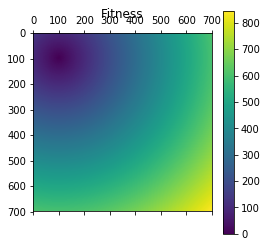

Calculating generation : 1
Calculating generation : 2
Calculating generation : 3
Calculating generation : 4
Calculating generation : 5
Calculating generation : 6
Calculating generation : 7
Calculating generation : 8
Calculating generation : 9
Calculating generation : 10
Calculating generation : 11
Calculating generation : 12
Calculating generation : 13
Calculating generation : 14
Calculating generation : 15
Calculating generation : 16
Calculating generation : 17
Calculating generation : 18
Calculating generation : 19
Calculating generation : 20
Calculating generation : 21
Calculating generation : 22
Calculating generation : 23
Calculating generation : 24
Calculating generation : 25
Calculating generation : 26
Calculating generation : 27
Calculating generation : 28
Calculating generation : 29
Calculating generation : 30
Calculating generation : 31
Calculating generation : 32
Calculating generation : 33
Calculating generation : 34
Calculating generation : 35
Calculating generation : 36
C

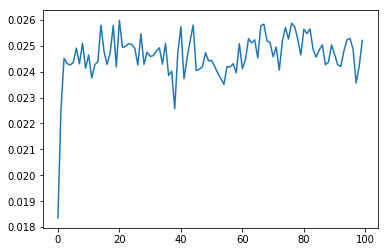

La simulation est terminée.


In [12]:

#DEFINITION DE LA PARTIE
obstacles = []
# On ajoute les murs
obstacles.append(Segment([0,0],[0,700]))
obstacles.append(Segment([0,0],[700,0]))
obstacles.append(Segment([700,0],[700,700]))
obstacles.append(Segment([0,700],[700,700]))
# On ajoute les obstacles
obstacles.append(Segment([300,300],[900,300]))
obstacles.append(Segment([0,500],[400,500]))


array_balle = [100,600]
array_trou = [100,100]
population = Population(nb_pop, array_trou, array_balle, obstacles, nbre_mouvements)
partie = Partie(array_balle,array_trou, obstacles)

plt.figure(1)
mat = partie.plot_fitness()
im1 = plt.matshow(mat)
plt.title("Fitness")
plt.colorbar(im1)
plt.plot([])
plt.show()


sumfits = []
for i in range(nb_gen):
    for j in range(len(population.liste_joueur)):
        population.liste_joueur[j].partie = Partie(array_balle,array_trou,obstacles) # On reset la partie
        population.liste_joueur[j].liste_emplacements = [array_balle]
    #if ((i+1)%10 == 0):
    print("Calculating generation : "+str(i+1))
    population.step_ga(nb_pop, array_trou,array_balle,obstacles,nbre_mouvements)
    population.liste_joueur = sorted(population.liste_joueur, key=lambda joueur: joueur.fitness, reverse = True)
    fits = [population.liste_joueur[i].fitness for i in range(nb_pop)]
    sumfits.append(sum(fits))
    population.step_ga(nb_pop, array_trou,array_balle,obstacles,nbre_mouvements)
    if (i%10 == 0):
        pickle.dump(population, open("./data/gen_mut"+str(i)+".pkl", 'wb')) 
    
    
    
plt.figure(2)
plt.plot(sumfits)
plt.show()
    

#population.print_partie(array_trou, array_balle, obstacles, nbre_mouvements)
    
    
print("La simulation est terminée.")
    








In [1]:
population = pickle.load( open( "./data/gen_mut90.pkl", "rb" ) )
population.print_partie(array_trou, array_balle, obstacles, nbre_mouvements)
#population.total_transform(array_trou, obstacles, array_balle)

NameError: name 'pickle' is not defined